In [1]:
from src.loaders import generic_loaders
import yaml
import tifffile

from matplotlib import pyplot as plt
%matplotlib inline

from tqdm.auto import tqdm

In [2]:
with open('training_configs/dataset/gatherers/video_paganin.yaml') as f:
    dg_cfg = yaml.safe_load(f)
with open('training_configs/dataset/datasets/n2n_shift_ssim_paganin.yaml') as f:
    dd_cfg = yaml.safe_load(f)

In [3]:
for d in dg_cfg:
    d.update({'split_kwargs': {'volumes_limit': 2}})

In [4]:
%%time
dldrs = generic_loaders(dg_cfg, dd_cfg, 42)

CPU times: user 5.31 s, sys: 56.8 s, total: 1min 2s
Wall time: 1min 48s


In [5]:
len(dldrs[0]['train'].dataset)

15092

In [11]:
%%time
batch = dldrs[0]['train'].__iter__().__next__()

CPU times: user 90.3 ms, sys: 7.73 s, total: 7.82 s
Wall time: 9.61 s


In [21]:
[d.volume.mean() for d in tqdm(dldrs[0]['train'].dataset.datasets)]

  0%|          | 0/103 [00:00<?, ?it/s]

[0.9669365,
 0.9676564,
 1.0084496,
 0.96609086,
 0.96696943,
 0.9670539,
 0.96692806,
 0.9677862,
 1.0179248,
 0.97390777,
 0.97304684,
 0.96974134,
 1.006946,
 1.0265942,
 1.0051538,
 1.047552,
 0.9615554,
 0.9668033,
 1.030966,
 0.96759915,
 0.99959606,
 0.96830165,
 1.0163398,
 0.9658298,
 1.0196059,
 1.0482905,
 0.9687528,
 0.98364145,
 0.9941311,
 0.96621317,
 0.9665881,
 0.9675996,
 1.0069306,
 0.99273354,
 1.0212728,
 0.99006206,
 0.96963465,
 0.967153,
 0.961422,
 0.96146077,
 0.9731981,
 0.96593195,
 0.9614584,
 0.97204566,
 0.9689767,
 0.982241,
 0.98336023,
 0.9663049,
 0.96633244,
 0.9639323,
 0.9664332,
 0.96562386,
 0.96457726,
 1.0163264,
 0.969386,
 0.965464,
 0.9660396,
 0.9664447,
 0.9836775,
 0.98107624,
 0.9633514,
 0.9674716,
 0.96634585,
 0.9860679,
 0.96620595,
 0.96197075,
 0.98086977,
 0.9645314,
 0.95248675,
 0.9649672,
 0.9848797,
 0.9651617,
 0.9637767,
 0.96574074,
 0.96663326,
 0.98995954,
 0.9825737,
 0.965051,
 0.9640071,
 0.95411885,
 0.9683634,
 0.966

In [6]:
batch[0].shape

torch.Size([64, 2, 256, 256])

In [8]:
len(dldrs[0]['train'].dataset)

208893

In [15]:
len(dldrs[0]['valid'].dataset)

54706

array([0.10937266, 0.1122341 , 0.11411054, ..., 0.02403434, 0.02514341,
       0.02551083], dtype=float32)

(array([4.294900e+04, 5.695040e+05, 2.276959e+06, 1.078096e+06,
        1.710990e+05, 2.927900e+04, 1.633000e+04, 7.273000e+03,
        2.265000e+03, 5.500000e+02]),
 array([-0.25309876, -0.14175306, -0.03040737,  0.08093832,  0.19228402,
         0.3036297 ,  0.4149754 ,  0.5263211 ,  0.6376668 ,  0.7490125 ,
         0.8603582 ], dtype=float32),
 <BarContainer object of 10 artists>)

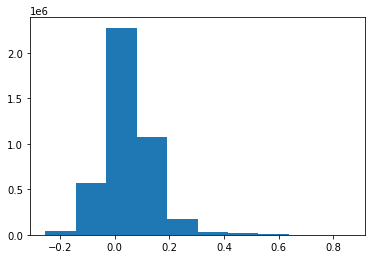

In [20]:
plt.hist(batch[0].flatten().numpy(), bins=30)

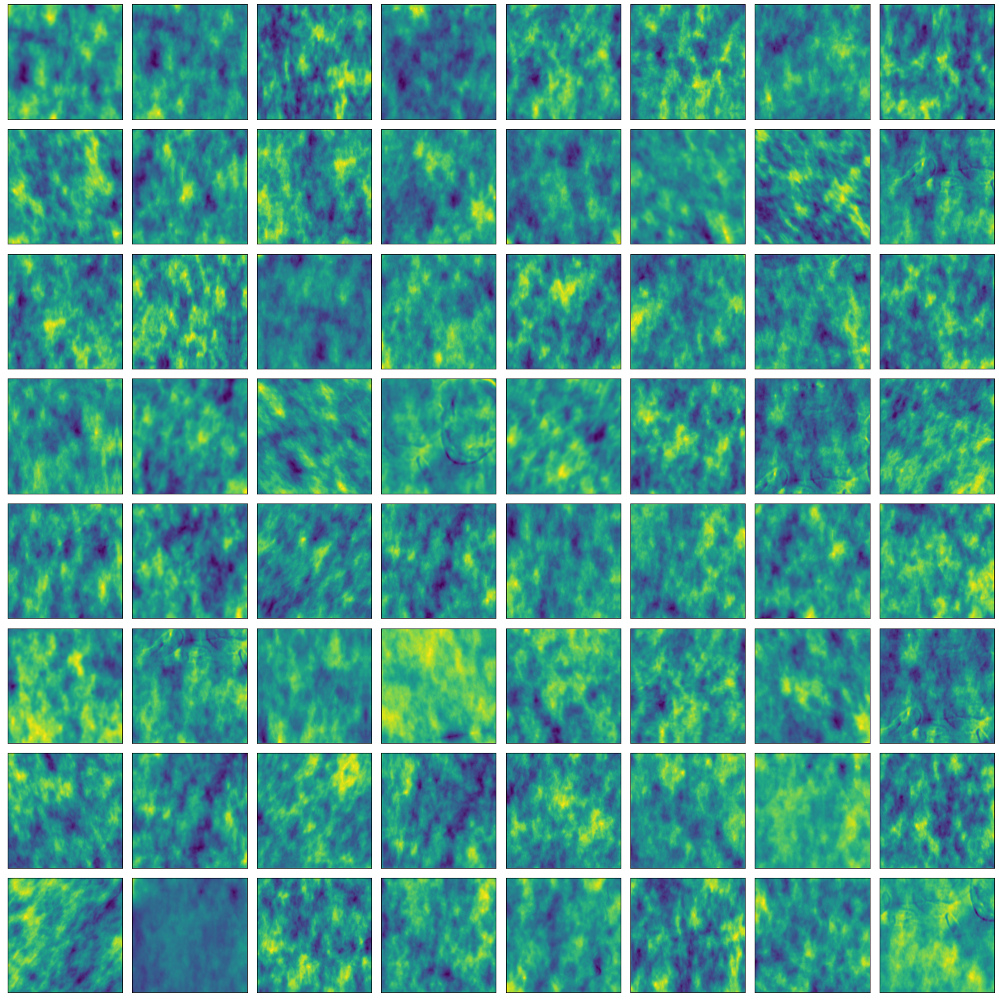

In [6]:
fig, axes = plt.subplots(ncols=8, nrows=8, figsize=(20, 20))
for i in range(64):
    cax = axes[i//8][i%8]
    cax.imshow(batch[0][i][0] - batch[1][i][0])
    cax.set_xticks([])
    cax.set_yticks([])
plt.tight_layout()
plt.show()

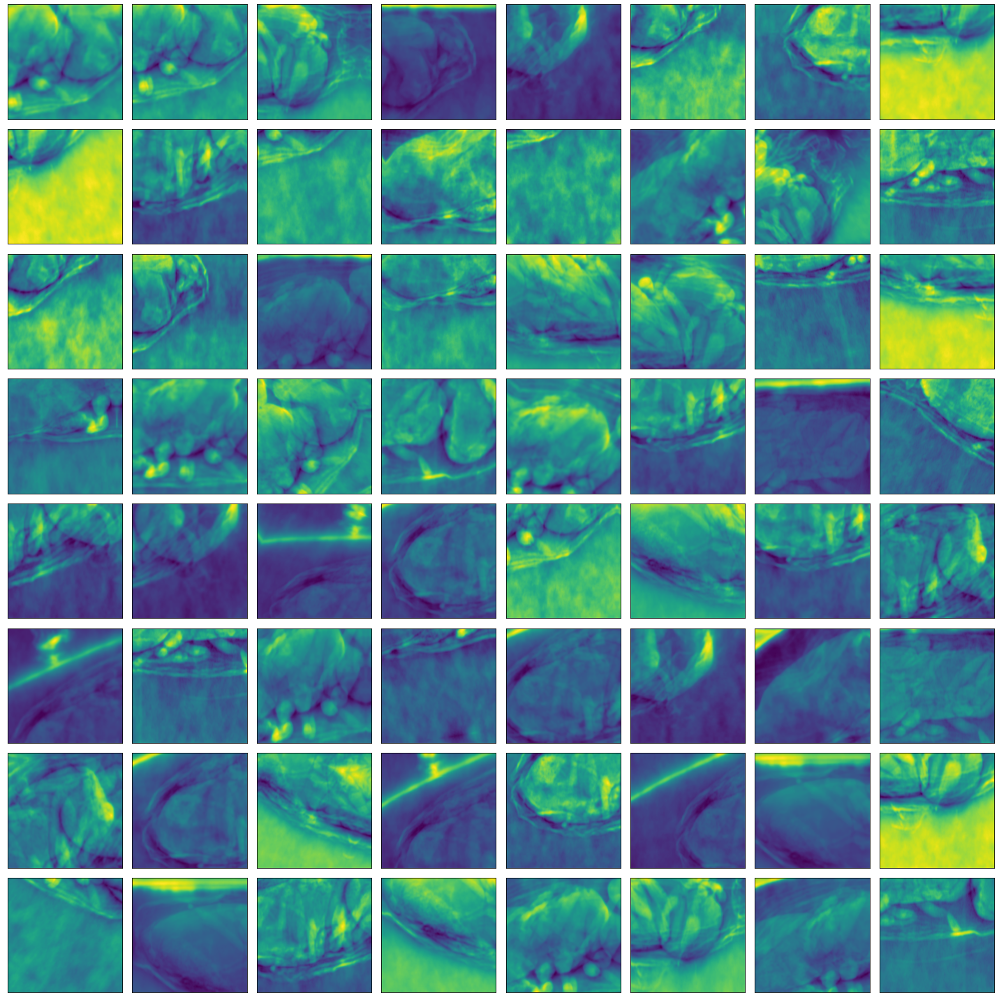

In [7]:
fig, axes = plt.subplots(ncols=8, nrows=8, figsize=(20, 20))
for i in range(64):
    cax = axes[i//8][i%8]
    cax.imshow(batch[0][i][0])
    cax.set_xticks([])
    cax.set_yticks([])
plt.tight_layout()
plt.show()

In [8]:
%%time
batch = dldrs[0]['valid'].__iter__().__next__()

CPU times: user 1.95 s, sys: 12.1 s, total: 14.1 s
Wall time: 14.9 s


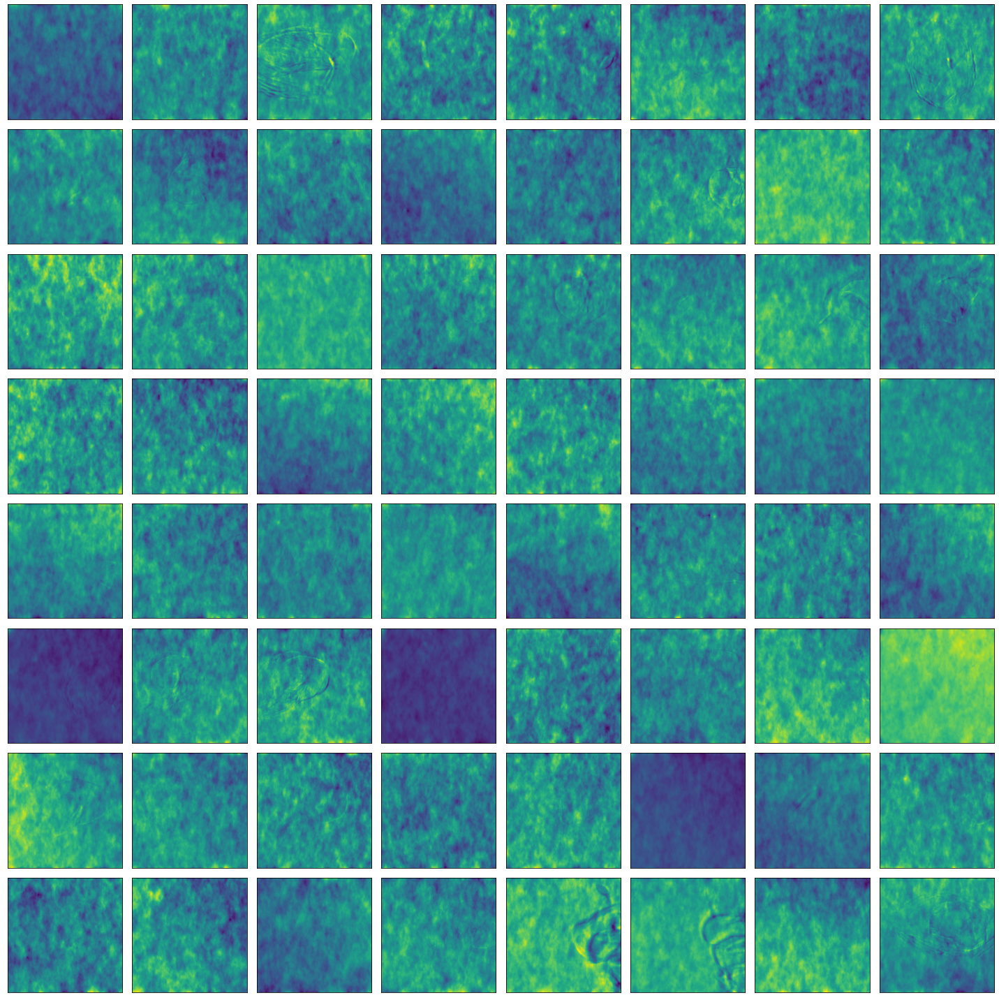

In [9]:
fig, axes = plt.subplots(ncols=8, nrows=8, figsize=(20, 20))
for i in range(64):
    cax = axes[i//8][i%8]
    cax.imshow(batch[0][i][0] - batch[1][i][0])
    cax.set_xticks([])
    cax.set_yticks([])
plt.tight_layout()
plt.show()

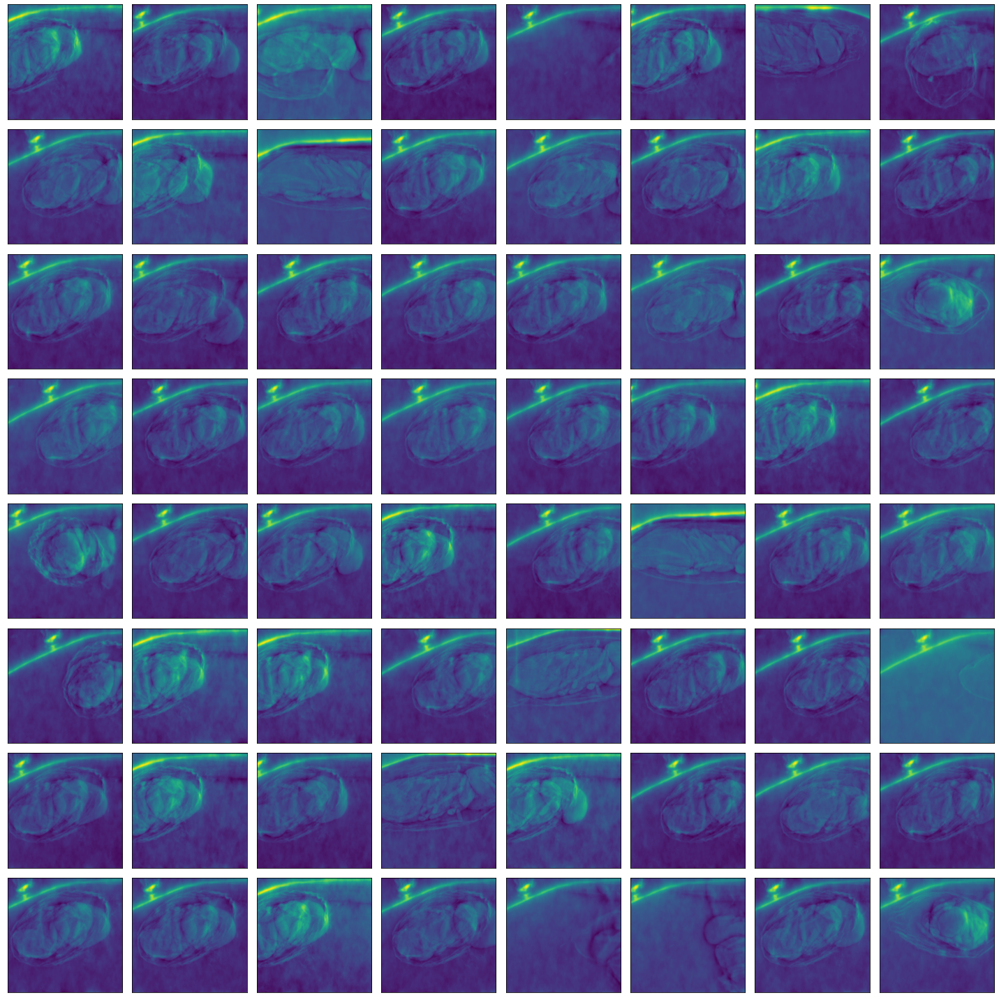

In [10]:
fig, axes = plt.subplots(ncols=8, nrows=8, figsize=(20, 20))
for i in range(64):
    cax = axes[i//8][i%8]
    cax.imshow(batch[0][i][0])
    cax.set_xticks([])
    cax.set_yticks([])
plt.tight_layout()
plt.show()